In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import metrics


In [4]:
df=pd.read_csv("E:\Data Set\winequality-white - winequality-white.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [6]:
df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


In [7]:
df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


In [8]:
x=.30
datarowSeries=[pd.Series([7.8+x,0.88+x,0.00+x,1.9,0.09+x,25.0+x,67.0+x,.991+x,3.22,0.68+x,9.8+x,5],index=df.columns),
              pd.Series([7.2+x,0.83+x,0.01+x,2.2,0.19+x,15.0+x,60.0+x,.996+x,3.52,0.55+x,9.6+x,6],index=df.columns),
              pd.Series([7.9+x,0.89+x,0.01+x,1.7,0.08+x,22.0+x,57.0+x,.997+x,3.26,0.64+x,9.8+x,2],index=df.columns),
              pd.Series([7.7+x,0.86+x,0.02+x,2.3,0.07+x,11.0+x,38.0+x,.994+x,3.12,0.08+x,9.4+x,3],index=df.columns)]
datarowSeries

[fixed acidity            8.100
 volatile acidity         1.180
 citric acid              0.300
 residual sugar           1.900
 chlorides                0.390
 free sulfur dioxide     25.300
 total sulfur dioxide    67.300
 density                  1.291
 pH                       3.220
 sulphates                0.980
 alcohol                 10.100
 quality                  5.000
 dtype: float64,
 fixed acidity            7.500
 volatile acidity         1.130
 citric acid              0.310
 residual sugar           2.200
 chlorides                0.490
 free sulfur dioxide     15.300
 total sulfur dioxide    60.300
 density                  1.296
 pH                       3.520
 sulphates                0.850
 alcohol                  9.900
 quality                  6.000
 dtype: float64,
 fixed acidity            8.200
 volatile acidity         1.190
 citric acid              0.310
 residual sugar           1.700
 chlorides                0.380
 free sulfur dioxide     22.300
 total

In [9]:
new_data=df.append(datarowSeries,ignore_index=True)
new_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6.0
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6.0
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6.0
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6.0
4898,8.1,1.18,0.30,1.9,0.390,25.3,67.3,1.29100,3.22,0.98,10.1,5.0
4899,7.5,1.13,0.31,2.2,0.490,15.3,60.3,1.29600,3.52,0.85,9.9,6.0
4900,8.2,1.19,0.31,1.7,0.380,22.3,57.3,1.29700,3.26,0.94,10.1,2.0


In [10]:
def function(x):
    if x<=5:
        return 'Bad'
    else:
        return 'Good'
new_data['quality']=new_data['quality'].apply(function)
new_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,Good
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,Good
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,Good
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,Good
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,Good
...,...,...,...,...,...,...,...,...,...,...,...,...
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,Good
4898,8.1,1.18,0.30,1.9,0.390,25.3,67.3,1.29100,3.22,0.98,10.1,Bad
4899,7.5,1.13,0.31,2.2,0.490,15.3,60.3,1.29600,3.52,0.85,9.9,Good
4900,8.2,1.19,0.31,1.7,0.380,22.3,57.3,1.29700,3.26,0.94,10.1,Bad


In [11]:
new_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000
mean,6.855681,0.278965,0.334172,6.387852,0.046068,35.294410,138.293288,0.994273,3.188341,0.490090,10.513807
std,0.844138,0.103889,0.120973,5.071525,0.024198,17.007666,42.547199,0.009087,0.151021,0.114601,1.230233
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991730,3.090000,0.410000,9.500000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993750,3.180000,0.470000,10.400000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000
max,14.200000,1.190000,1.660000,65.800000,0.490000,289.000000,440.000000,1.297000,3.820000,1.080000,14.200000


In [12]:
new_data.mean()

c:\program files\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


fixed acidity             6.855681
volatile acidity          0.278965
citric acid               0.334172
residual sugar            6.387852
chlorides                 0.046068
free sulfur dioxide      35.294410
total sulfur dioxide    138.293288
density                   0.994273
pH                        3.188341
sulphates                 0.490090
alcohol                  10.513807
dtype: float64

In [13]:
new_data.median()

c:\program files\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


fixed acidity             6.80000
volatile acidity          0.26000
citric acid               0.32000
residual sugar            5.20000
chlorides                 0.04300
free sulfur dioxide      34.00000
total sulfur dioxide    134.00000
density                   0.99375
pH                        3.18000
sulphates                 0.47000
alcohol                  10.40000
dtype: float64

In [14]:
new_data.mode()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.8,0.28,0.3,1.2,0.044,29.0,111.0,0.992,3.14,0.5,9.4,Good


## Exploratory Data Analysis

## Pie Chart

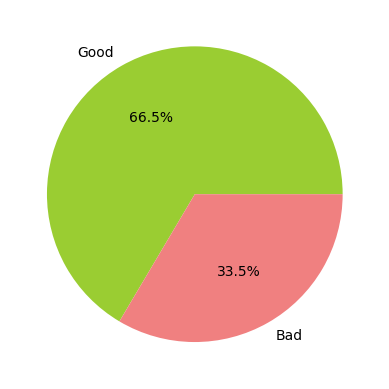

In [15]:
status_fre=[3259,1643]
plt.pie(status_fre,labels=['Good','Bad'],colors=['yellowgreen','lightcoral'],autopct='%.1f%%')
plt.show()

## Bar Diagram

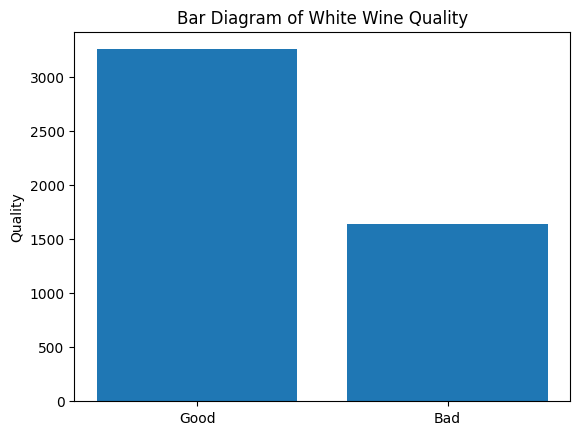

In [17]:
objects=('Good','Bad')
x_pos=np.arange(len(objects))
status_fre=[3259,1643]
plt.bar(x_pos,status_fre)
plt.xticks(x_pos,objects)
plt.ylabel('Quality')
plt.title('Bar Diagram of White Wine Quality')
plt.show()

## Scatter Diagram

In [18]:
sns.set_style('whitegrid');
sns.pairplot(new_data,hue='quality',height=8)
plt.title('Scatter Diagram of White Wine Quality Analysis')
plt.show()

## Logistic Regression

In [23]:
import statsmodels.api as sm
x=new_data.drop('quality',axis='columns')
y=new_data['quality'].map({'Bad':0,'Good':1})
logitmodel=sm.Logit(y,x)
result=logitmodel.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.506355
         Iterations 6
                            Results: Logit
Model:                Logit             Pseudo R-squared:  0.206      
Dependent Variable:   quality           AIC:               4986.3065  
Date:                 2024-01-03 16:54  BIC:               5057.7779  
No. Observations:     4902              Log-Likelihood:    -2482.2    
Df Model:             10                LL-Null:           -3126.4    
Df Residuals:         4891              LLR p-value:       1.1712e-270
Converged:            1.0000            Scale:             1.0000     
No. Iterations:       6.0000                                          
----------------------------------------------------------------------
                      Coef.  Std.Err.    z     P>|z|   [0.025   0.975]
----------------------------------------------------------------------
fixed acidity        -0.1611   0.0474  -3.3971 0.0007  -0.2540 -0.0681
vol

## Confusion Matrix

## Logistic Regression


In [28]:
import numpy as np
from  sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,roc_auc_score,roc_curve
import matplotlib.pyplot as plt


In [84]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=114)
model=LogisticRegression()
model.fit(x_train,y_train)
y_pred=model.predict(x_test)
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('Precision:',precision_score(y_test,y_pred))
print('Sensitivity:',recall_score(y_test,y_pred))
specificity=cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity:',specificity)

[[221 282]
 [103 865]]
Accuracy: 0.7382732834806254
Precision: 0.7541412380122058
Sensitivity: 0.893595041322314
Specificity: 0.4393638170974155


c:\program files\python37\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


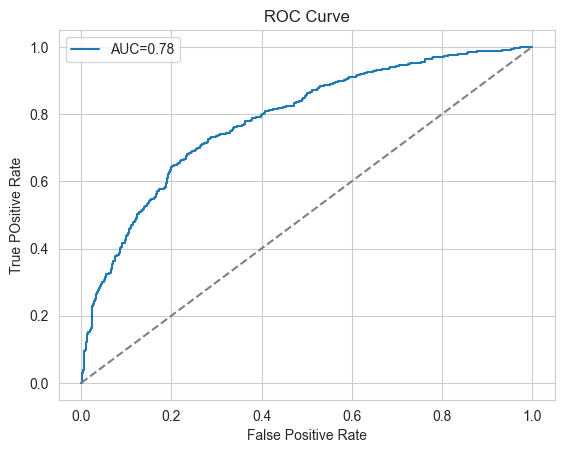

ROC-AUC Score:0.783660


In [99]:
fpr,tpr,thresholds=roc_curve(y_test,model.predict_proba(x_test)[:,1])
roc_auc=roc_auc_score(y_test,model.predict_proba(x_test)[:,1])
plt.plot(fpr,tpr,label=f'AUC={roc_auc:.2f}')
plt.plot([0,1],[0,1],linestyle='--',color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True POsitive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()
print(f'ROC-AUC Score:{roc_auc:02f}')

## Decision Tree

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,roc_auc_score,roc_curve
import matplotlib.pyplot as plt
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=114)
clf=DecisionTreeClassifier(random_state=114)
clf.fit(x_train,y_train)
y_pred=clf.predict(x_test)
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('Precision:',precision_score(y_test,y_pred))
print('Sensitivity:',recall_score(y_test,y_pred))
specificity=cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity:',specificity)

[[333 170]
 [161 807]]
Accuracy: 0.7749830047586675
Precision: 0.8259979529170931
Sensitivity: 0.8336776859504132
Specificity: 0.6620278330019881


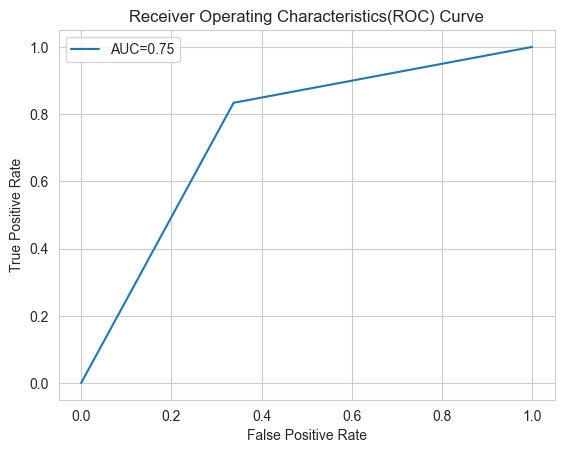

ROC-AUC Score:0.747853


In [130]:
roc_auc=roc_auc_score(y_test,clf.predict_proba(x_test)[:,1])
fpr,tpr,_=roc_curve(y_test,clf.predict_proba(x_test)[:,1])
plt.plot(fpr,tpr,label=f'AUC={roc_auc:.2f}')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristics(ROC) Curve')
plt.legend()
plt.show()
print(f'ROC-AUC Score:{roc_auc:02f}')

## Random Forest

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,roc_curve
import matplotlib.pyplot as plt
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=114)
rf_model=RandomForestClassifier(n_estimators=100,random_state=42)
rf_model.fit(x_train,y_train)
y_pred=rf_model.predict(x_test)
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('Precision:',precision_score(y_test,y_pred))
print('Sensitivity:',recall_score(y_test,y_pred))
specificity=cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity:',specificity)


[[342 161]
 [ 97 871]]
Accuracy: 0.8246091094493542
Precision: 0.8439922480620154
Sensitivity: 0.8997933884297521
Specificity: 0.679920477137177


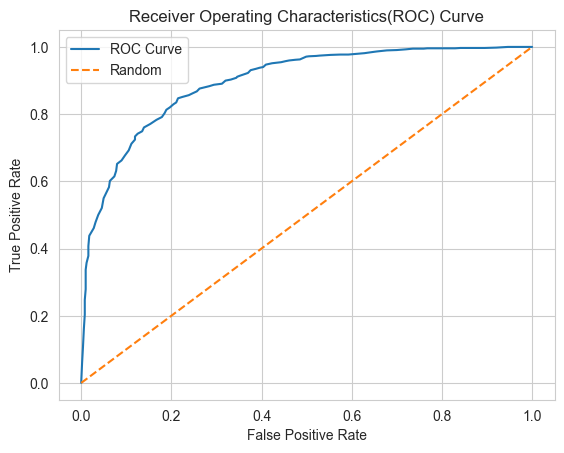

ROC-AUC Score:0.783660


In [98]:
roc_score=roc_auc_score(y_test,rf_model.predict_proba(x_test)[:,1])
fpr,tpr,thresholds=roc_curve(y_test,rf_model.predict_proba(x_test)[:,1])
plt.plot(fpr,tpr,label='ROC Curve')
plt.plot([0,1],[0,1],linestyle='--',label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristics(ROC) Curve')
plt.legend()
plt.show()
print(f'ROC-AUC Score:{roc_auc:02f}')

## Support Vactor Machine

In [106]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,precision_score,recall_score,roc_auc_score,roc_curve,confusion_matrix
import matplotlib.pyplot as plt
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=114)
svm_model=SVC(kernel='linear',C=1.0)
svm_model.fit(x_train,y_train)
y_pred=svm_model.predict(x_test)
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('Accuracy:',accuracy_score(y_test,y_pred))
print('Precision:',precision_score(y_test,y_pred))
print('Sensitivity:',recall_score(y_test,y_pred))
specificity=cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity:',specificity)


[[211 292]
 [ 85 883]]
Accuracy: 0.7437117607070021
Precision: 0.7514893617021277
Sensitivity: 0.9121900826446281
Specificity: 0.4194831013916501


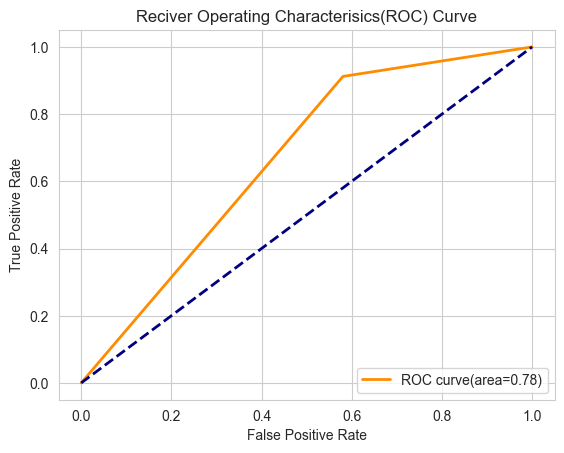

ROC AUC Score: 0.7836596125724988


In [113]:
fpr,tpr,_=roc_curve(y_test,y_pred)
plt.plot(fpr,tpr,color='darkorange',lw=2,label='ROC curve(area={:.2f})'.format(roc_auc))
plt.plot([0,1],[0,1],color='navy',lw=2,linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Reciver Operating Characterisics(ROC) Curve')
plt.legend(loc='lower right')
plt.show()
print('ROC AUC Score:',roc_auc)